# 見やすい地形図をつくる
- [地理院タイル一覧](http://maps.gsi.go.jp/development/ichiran.html)
- [タイル座標確認ページ](http://maps.gsi.go.jp/development/tileCoordCheck.html)
- [地理院タイル仕様](http://maps.gsi.go.jp/development/siyou.html)
- [標高タイルの詳細仕様](http://maps.gsi.go.jp/development/demtile.html)

## 1. 準備

### 1.1 import

In [1]:
import urllib
import os
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
%matplotlib inline

### 1.2 地理院タイルをダウンロードする関数・arrayとして取り込む関数

In [3]:
def maybe_download(url, name):
    """ ファイルがなければダウンロード """
    if not os.path.exists(name):
        urllib.urlretrieve(url, name)
        print "File " + name + " downloaded!"
    return name

def read_tile(name):
    """ csv file -> numpy array """
    ret = np.genfromtxt(name, delimiter=",", filling_values=0.) # 'e' -> 0.0 （海など?）
    if ret.shape == (256, 256):
        return ret
    else: # 国外だとデータがないので0としておく
        return np.zeros((256, 256))

### 1.3 任意の領域・ズームレベルで各種地理院タイルを取得する関数

In [17]:
def get_maps(from_tile, to_tile=None, zoom=None, tile_type="std", ext="png",):
    """ 指定された領域に含まれるすべての地図タイルを任意のズームレベルで取得する
    Inputs:
        file_type, ext: 取得したいタイルの種類・拡張子
        -> http://cyberjapandata.gsi.go.jp/xyz/<tile_type>/{z}/{x}/{y}.<ext>を取得する
        from_tile, to_tile: 取得したい領域内の左上、右下のタイル座標（それぞれ[z, x, y]のリスト）
        zoom: ズームレベル
    Outputs:
        full_tile: 指定した領域の地図タイルを結合したもの（numpyのarray）
    """
    if zoom == None:# zoomを省略するとfrom_tileと同じになる
        zoom =from_tile[0]
    if to_tile == None:# to_tileを省略するとfrom_tileと同じになる
        to_tile = from_tile
    MAX_ZOOM = 18
    assert zoom <= MAX_ZOOM

    # 指定されたzoomにおける左上のタイル座標
    x1 = from_tile[1] * 2**(zoom - from_tile[0])
    y1 = from_tile[2] * 2**(zoom - from_tile[0])
    # 指定されたzoomにおける右下のタイル座標
    x2 = (to_tile[1] + 1) * 2**(zoom - to_tile[0]) - 1 # すぐ右下を考え、それから-1
    y2 = (to_tile[2] + 1) * 2**(zoom - to_tile[0]) - 1 # すぐ右下を考え、それから-1
    
    # 左上〜右下すべてのタイルの座標
    tile_list = []
    for j in range(y1, y2+1):
        tile_row = []
        for i in range(x1, x2+1):
            tile_row.append([zoom, i, j])
        tile_list.append(tile_row)
    
    # ダウンロード
    full_tile = []
    for tile_row in tile_list:
        tr = []
        for tile in tile_row:
            tile_url = "http://cyberjapandata.gsi.go.jp/xyz/{tile_type}/{z}/{x}/{y}.{ext}".format(tile_type=tile_type, 
                                                                                                  z=tile[0], x=tile[1], y=tile[2],
                                                                                                  ext=ext)
            if ext=="png" or ext=="jpg":
                tile_name = "{ext}/{tile_type}_{z}_{x}_{y}.{ext}".format(ext=ext, tile_type=tile_type, z=tile[0], x=tile[1], y=tile[2])
                maybe_download(tile_url, tile_name)
                tr.append(np.array(Image.open(tile_name)))
            elif ext=="txt":
                # save as .csv
                tile_name = "csv/{tile_type}_{z}_{x}_{y}.csv".format(tile_type=tile_type, z=tile[0], x=tile[1], y=tile[2])
                maybe_download(tile_url, tile_name)
                tr.append(read_tile(tile_name)) # 'e'->0.0
            else:
                raise ValueError(".jpg, .png, .txt supported")
        full_tile.append(np.hstack(tr))
    full_tile = np.vstack(full_tile)
    return full_tile

#### Usage

(256, 256)
(256, 256, 3)
(256, 256, 3)


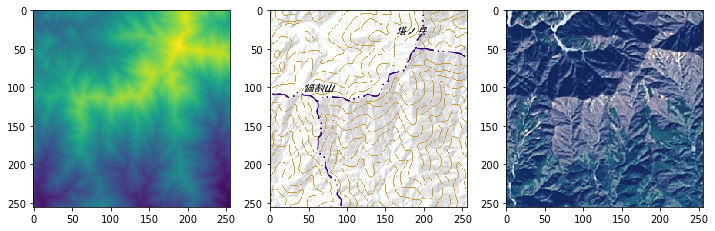

In [40]:
# タイル座標13/7262/3232の,

# 標高タイルを取得したい場合
nabewari_dem = get_maps([13, 7262, 3232], tile_type="dem", ext="txt")
print nabewari_dem.shape # 地理院タイルは1つあたり256x256

# 標準地図タイルを取得したい場合
nabewari_std = get_maps([13, 7262, 3232], tile_type="std", ext="png")
print nabewari_std.shape # 地理院タイルは1つあたり256x256

# 写真タイルを取得したい場合
nabewari_seamlessphoto = get_maps([13, 7262, 3232], tile_type="seamlessphoto", ext="jpg")
print nabewari_seamlessphoto.shape # 地理院タイルは1つあたり256x256

# plot
fig = plt.figure(figsize=(12, 6))
ax = fig.add_subplot(1, 3, 1)
ax.imshow(nabewari_dem, interpolation="none")

ax2 = fig.add_subplot(1, 3, 2)
ax2.imshow(nabewari_std, interpolation="none")

ax3 = fig.add_subplot(1, 3, 3)
ax3.imshow(nabewari_seamlessphoto, interpolation="none")

## 2. 色別標高図と地形図を混ぜる

(768, 768, 3)
File png/relief_15_29048_12929.png downloaded!
File png/relief_15_29049_12929.png downloaded!
File png/relief_15_29050_12929.png downloaded!
File png/relief_15_29048_12930.png downloaded!
File png/relief_15_29049_12930.png downloaded!
File png/relief_15_29050_12930.png downloaded!
File png/relief_15_29048_12931.png downloaded!
File png/relief_15_29049_12931.png downloaded!
File png/relief_15_29050_12931.png downloaded!
(768, 768, 3)


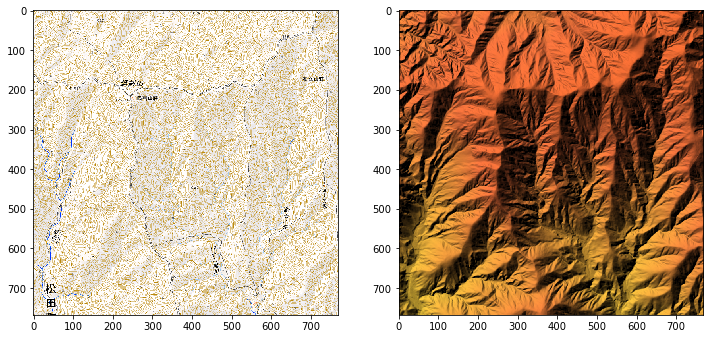

In [46]:
nabewari_std = get_maps([15, 29048, 12929], [15, 29050, 12931], tile_type="std")
print nabewari_std.shape

nabewari_relief = get_maps([15, 29048, 12929], [15, 29050, 12931], tile_type="relief")
print nabewari_relief.shape


fig = plt.figure(figsize=(12, 6))
ax = fig.add_subplot(1, 2, 1)
ax.imshow(nabewari_std, interpolation="none")

ax2 = fig.add_subplot(1, 2, 2)
ax2.imshow(nabewari_relief, interpolation="none")

(768, 768, 3)


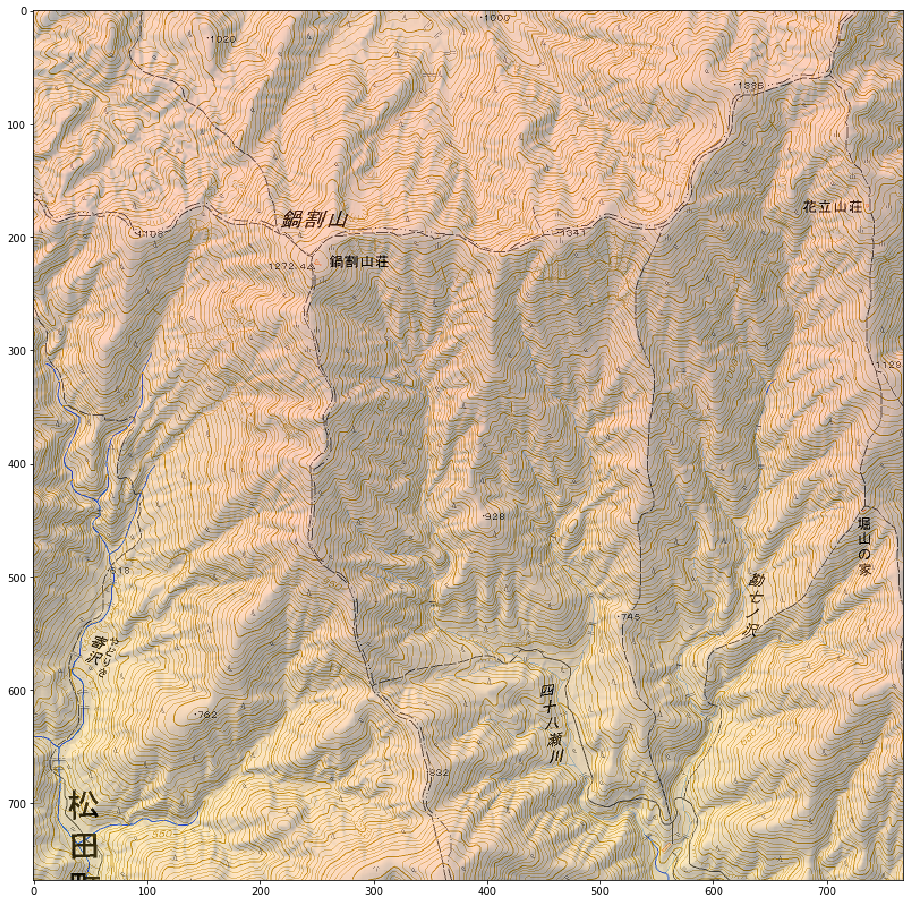

In [68]:
alpha = 0.3
mixed = nabewari_std*(1.-alpha) + nabewari_relief*alpha
print mixed.shape

# plot
fig = plt.figure(figsize=(16, 16))
plt.imshow(mixed.astype(np.uint8))

(768, 768, 4)
(768, 768, 3)


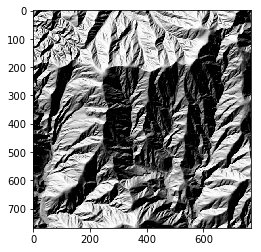

In [76]:
nabewari_hillshademap = get_maps([15, 29048, 12929], [15, 29050, 12931], tile_type="hillshademap")
print nabewari_hillshademap.shape
nabewari_hillshademap = nabewari_hillshademap[:, :, :3]
print nabewari_hillshademap.shape
plt.imshow(nabewari_hillshademap)

(768, 768, 3)


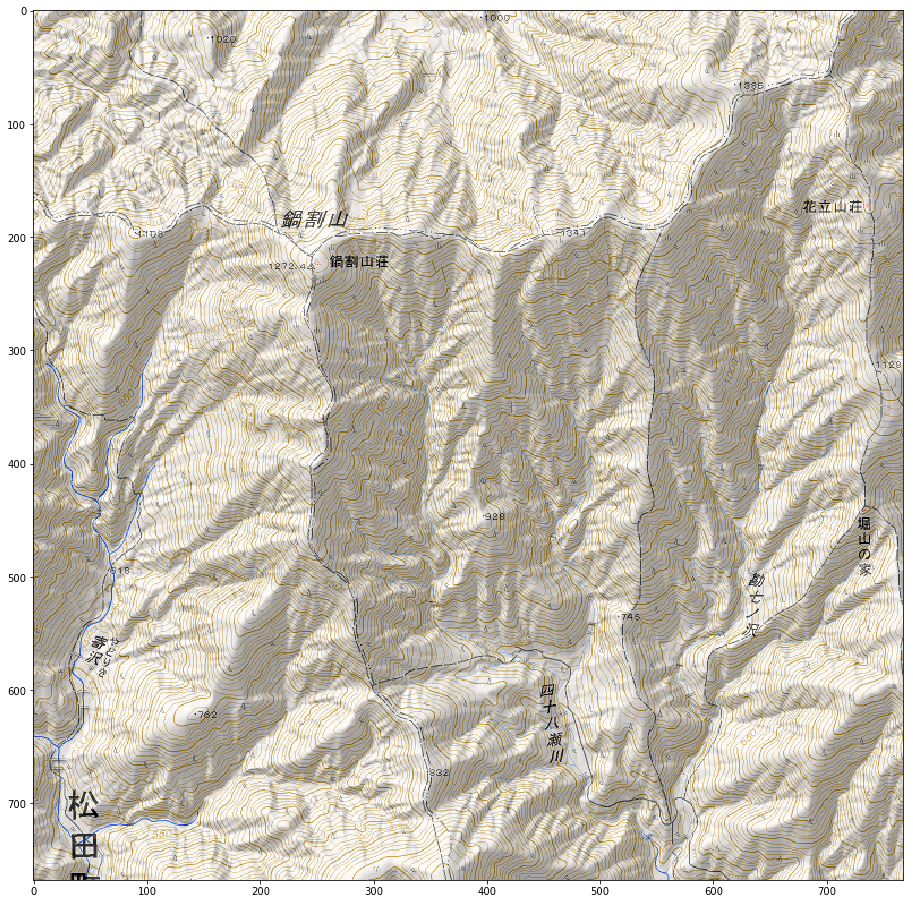

In [77]:
alpha = 0.3
mixed2 = nabewari_std*(1.-alpha) + nabewari_hillshademap*alpha
print mixed2.shape

# plot
fig = plt.figure(figsize=(16, 16))
plt.imshow(mixed2.astype(np.uint8))

(768, 768, 4)
(768, 768, 3)


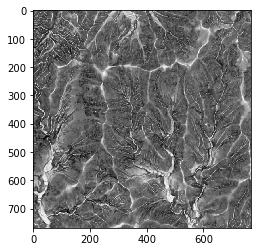

In [80]:
nabewari_slopemap = get_maps([15, 29048, 12929], [15, 29050, 12931], tile_type="slopemap")
print nabewari_slopemap.shape
nabewari_slopemap = nabewari_slopemap[:, :, :3]
print nabewari_slopemap.shape
plt.imshow(nabewari_slopemap)

(768, 768, 3)


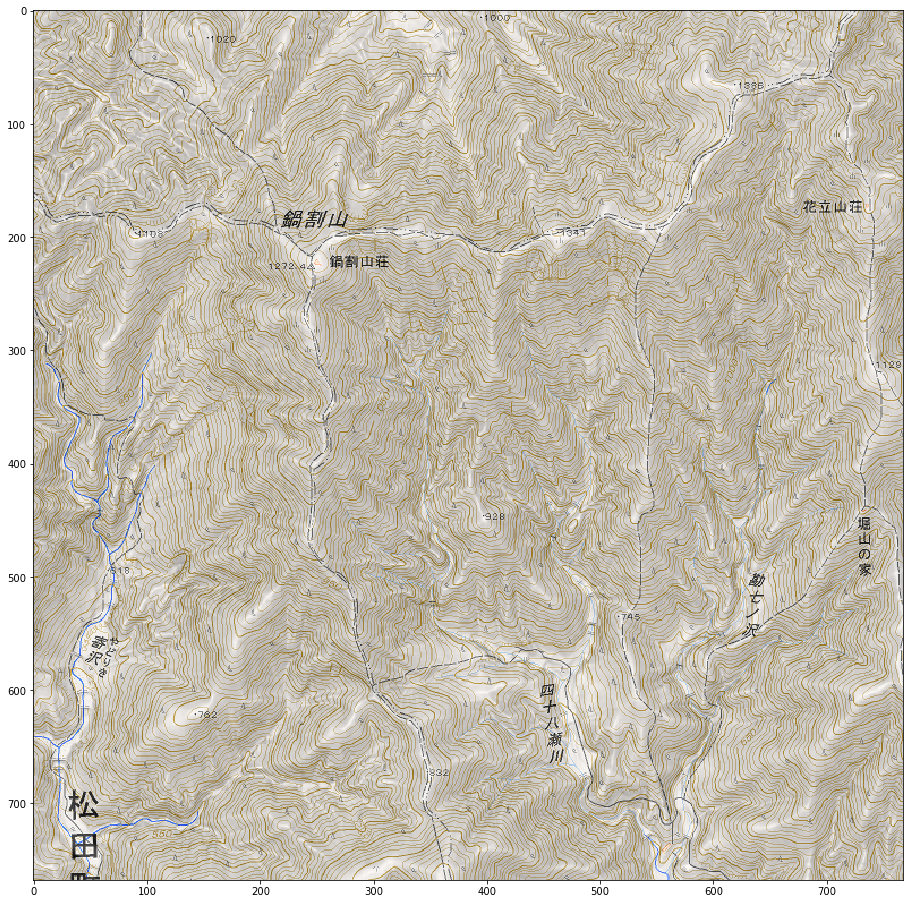

In [81]:
alpha = 0.3
mixed3 = nabewari_std*(1.-alpha) + nabewari_slopemap*alpha
print mixed3.shape

# plot
fig = plt.figure(figsize=(16, 16))
plt.imshow(mixed3.astype(np.uint8))

In [90]:
nabewari_dem = get_maps([15, 29048, 12929], [15, 29050, 12931], tile_type="dem5a", ext="txt")
print nabewari_dem.shape

File csv/dem5a_15_29048_12929.csv downloaded!
File csv/dem5a_15_29049_12929.csv downloaded!
File csv/dem5a_15_29050_12929.csv downloaded!
File csv/dem5a_15_29048_12930.csv downloaded!
File csv/dem5a_15_29049_12930.csv downloaded!
File csv/dem5a_15_29050_12930.csv downloaded!
File csv/dem5a_15_29048_12931.csv downloaded!
File csv/dem5a_15_29049_12931.csv downloaded!
File csv/dem5a_15_29050_12931.csv downloaded!
(768, 768)


In [95]:
print nabewari_dem.min(), nabewari_dem.max()

447.59 1408.4


In [158]:
hoge = nabewari_dem / 200

In [160]:
hoge = hoge.astype(np.int)

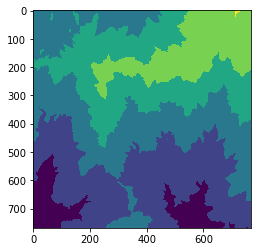

In [161]:
plt.imshow(hoge)

In [181]:
a = np.array(zip(30*hoge.flatten(),
                 hoge.flatten(),
                 250-30*hoge.flatten())).reshape(768, 768, 3)

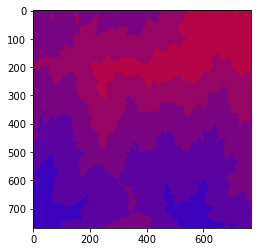

In [187]:
plt.imshow(a.astype(np.uint8))

In [169]:
fuga = np.array(zip(hoge.flatten(), hoge.flatten(), hoge.flatten())).reshape(768, 768, 3)
fuga = 30*fuga.astype(np.uint8)
fuga.shape

(768, 768, 3)

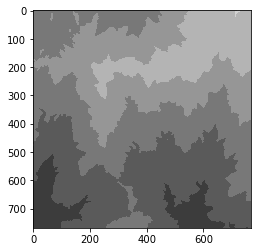

In [170]:
plt.imshow(fuga)

(768, 768, 3)


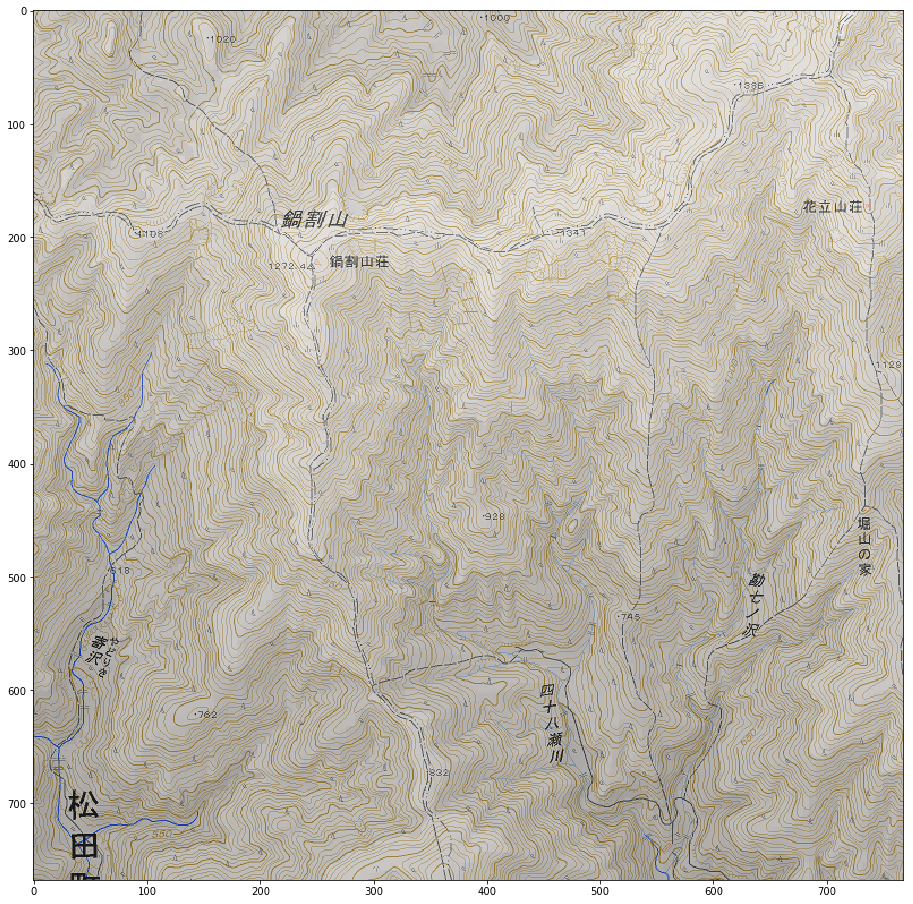

In [190]:
alpha = 0.4
mixed4 = nabewari_std*(1.-alpha) + fuga*alpha
print mixed4.shape

# plot
fig = plt.figure(figsize=(16, 16))
plt.imshow(mixed4.astype(np.uint8))

(768, 768, 3)


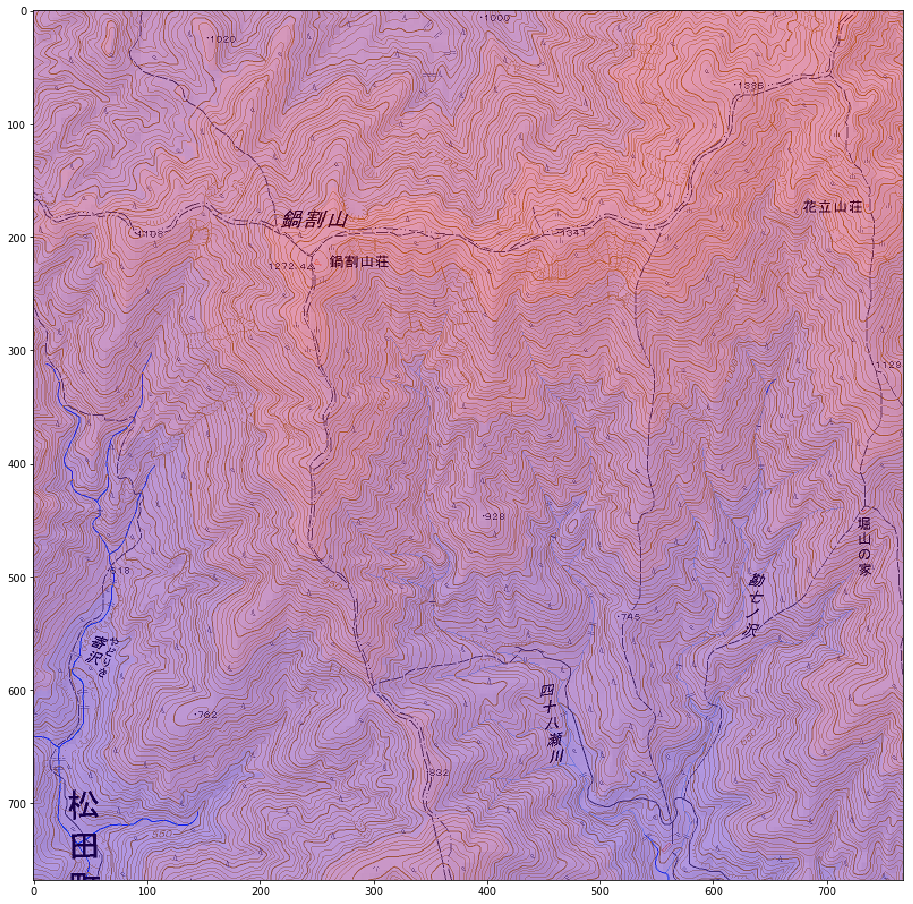

In [189]:
alpha = 0.4
mixed4 = nabewari_std*(1.-alpha) + a*alpha
print mixed4.shape

# plot
fig = plt.figure(figsize=(16, 16))
plt.imshow(mixed4.astype(np.uint8))